In [106]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


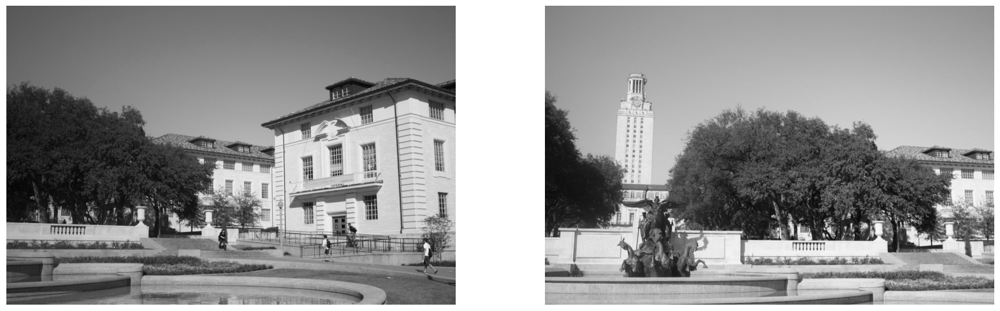

In [107]:
img_1 = cv2.imread('pano_image1.jpg')
img_2 = cv2.imread('pano_image2.jpg')

img_1 = cv2.cvtColor(img_1, cv2.COLOR_BGR2RGB) # type: ignore
img_2 = cv2.cvtColor(img_2, cv2.COLOR_BGR2RGB) # type: ignore
# Convert images to grayscale
gray_1 = cv2.cvtColor(img_1, cv2.COLOR_BGR2GRAY) # type: ignore
gray_2 = cv2.cvtColor(img_2, cv2.COLOR_BGR2GRAY) # type: ignore

plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.imshow(gray_1, cmap='gray')
plt.axis('off')
plt.subplot(1, 2, 2)
plt.imshow(gray_2, cmap='gray')
plt.axis('off')
plt.show()

###  Capturing the Descriptors of the keypoints using **SIFT**

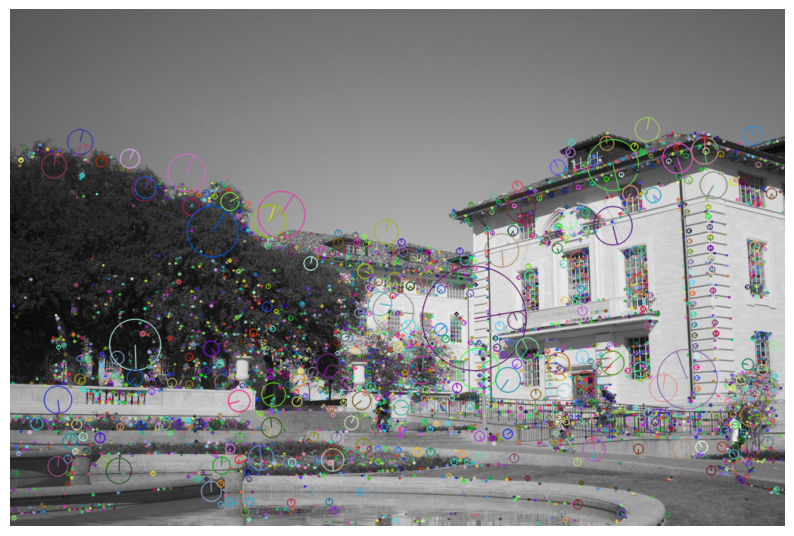

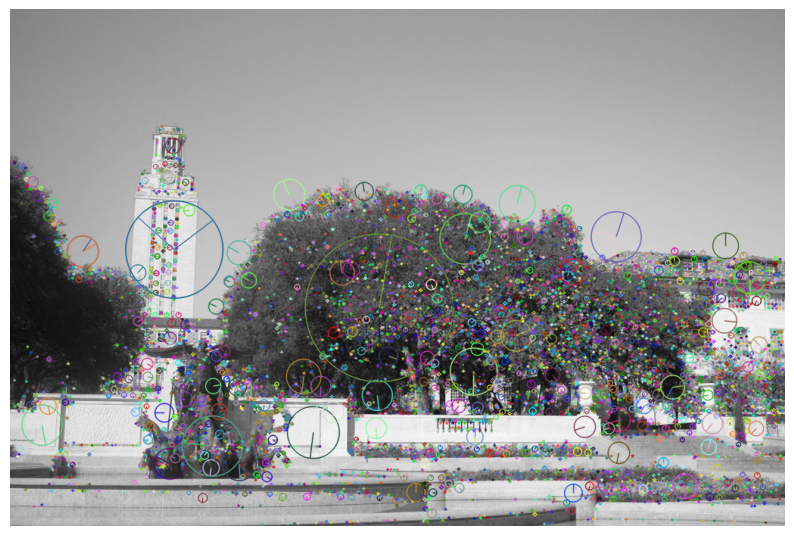

In [117]:
def CaptureKeypointsAndDescriptors(image):
    # Create SIFT detector
    sift = cv2.SIFT_create() # type: ignore
    
    # Detect keypoints and compute descriptors
    keypoints, descriptors = sift.detectAndCompute(image, None)
    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.drawKeypoints(image, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)) # type: ignore
    plt.axis('off')
    plt.show()
    
    return keypoints, descriptors
# Capture keypoints and descriptors for image 1
keypoints_1, descriptors_1 = CaptureKeypointsAndDescriptors(gray_1)

# Capture keypoints and descriptors for image 2
keypoints_2, descriptors_2 = CaptureKeypointsAndDescriptors(gray_2)


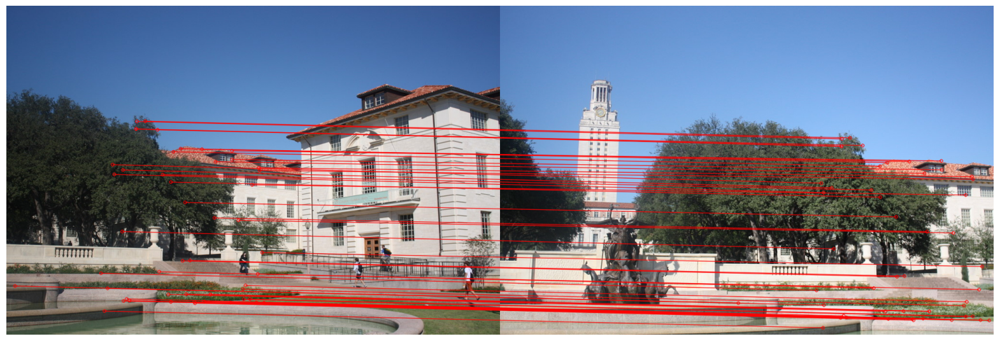

In [109]:
def brute_force_matching(descriptors_1, descriptors_2):
    # Create BFMatcher object
    bf = cv2.BFMatcher()
    
    # Match descriptors
    matches = bf.knnMatch(descriptors_1, descriptors_2, k=2)
    good_matches = []
    for m, n in matches:
        if m.distance < 0.75 * n.distance:
            good_matches.append(m)

    best_matches = sorted(good_matches, key=lambda m: m.distance)[:50]
    
    return best_matches
# Find matches between image 1 and image 2
best_matches = brute_force_matching(descriptors_1, descriptors_2)
# Draw matches
img_matches = cv2.drawMatches(img_1, keypoints_1, img_2, keypoints_2, best_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS, matchColor=(255, 0, 0)) # type: ignore
plt.figure(figsize=(20, 10))
plt.imshow(img_matches)
plt.axis('off')
plt.show()

### Compute the Homography Parameters

In [160]:
def ComputeHomography(keypoints_1, keypoints_2, matches):
    # without finding homography, we can not stitch the images together, so we need to compute the homography matrix
      # Extract matched keypoints
      src_pts = np.array([keypoints_1[m.queryIdx].pt for m in matches], dtype=np.float32).reshape(-1, 1, 2)
      dst_pts = np.array([keypoints_2[m.trainIdx].pt for m in matches], dtype=np.float32).reshape(-1, 1, 2)

      A = []
      number_of_points = len(src_pts)

      for i in range(number_of_points):
          x_1, y_1 = src_pts[i, 0, 0], src_pts[i, 0, 1]
          x_2, y_2 = dst_pts[i, 0, 0], dst_pts[i, 0, 1]

          A.append([x_1, y_1, 1, 0, 0, 0, -x_1 * x_2, -y_1 * x_2, -x_2])  # x'(h_7x + h_8y + h_9) = (h_1x + h_2y + h_3)
          A.append([0, 0, 0, x_1, y_1, 1, -x_1*y_2, -y_1*y_2, -y_2]) # y'(h_7x + h_8y + h_9) = (h_4x + h_5y + h_6)

      A = np.array(A)
      _, _, V = np.linalg.svd(A) # to solve Ah=0 and minimize reprojection error
      H = np.reshape(V[-1], (3, 3)) # reshape to 3x3
      H = (1 / H.item(8)) * H # dividing by the scale factor to make H(3x3) = 1
      return H
    

# Compute homography matrix
H = ComputeHomography(keypoints_1, keypoints_2, best_matches)
print("Homography Matrix:")
print(H)

Homography Matrix:
[[ 7.51742396e-01  3.27673835e-02  4.48836884e+02]
 [-1.38340628e-01  9.02662112e-01  7.82371607e+01]
 [-2.19134218e-04 -3.93453713e-05  1.00000000e+00]]


In [ ]:
def computeHomography_withFindHomography(keypoints_1, keypoints_2, matches):
    # Extract matched keypoints
    src_pts = np.array([keypoints_1[m.queryIdx].pt for m in matches], dtype=np.float32).reshape(-1, 1, 2)
    dst_pts = np.array([keypoints_2[m.trainIdx].pt for m in matches], dtype=np.float32).reshape(-1, 1, 2)

    # Compute homography using RANSAC
    H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC) # type: ignore
    return H
# Compute homography matrix using OpenCV's findHomography
H_cv2 = computeHomography_withFindHomography(keypoints_1, keypoints_2, best_matches)
print("Homography Matrix using OpenCV's findHomography:")
print(H_cv2)

Homography Matrix using OpenCV's findHomography:
[[ 7.52223417e-01  3.33630036e-02  4.48672713e+02]
 [-1.38275979e-01  9.03324745e-01  7.80905387e+01]
 [-2.18991458e-04 -3.87105780e-05  1.00000000e+00]]


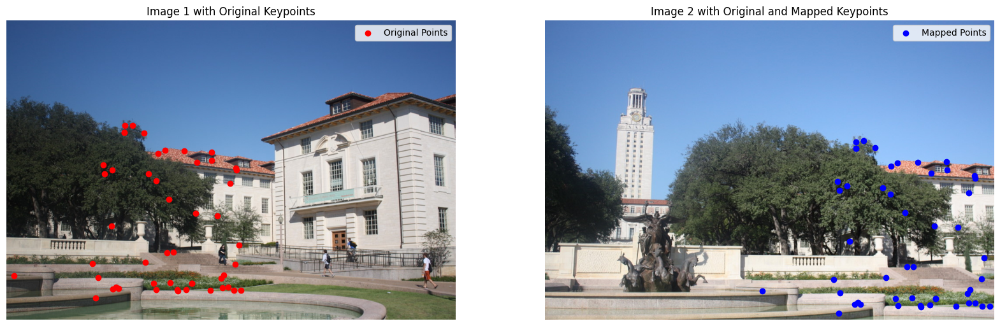

In [ ]:

def verify_homography(H, keypoints_1, keypoints_2, matches):


      # Extract matched keypoints
      src_pts = np.array([keypoints_1[m.queryIdx].pt for m in matches], dtype=np.float32)  # (N, 2)
      dst_pts = np.array([keypoints_2[m.trainIdx].pt for m in matches], dtype=np.float32)  # (N, 2)

      # Convert to homogeneous coordinates: (N, 3)
      src_pts_homogeneous = np.hstack(
         (src_pts, np.ones((src_pts.shape[0], 1), dtype=np.float32))
      )

      # Map points using homography
      mapped_pts_homogeneous = (H @ src_pts_homogeneous.T).T  # (N, 3)

      # Back to non-homogeneous coordinates: (N, 2)
      mapped_pts = mapped_pts_homogeneous[:, :2] / mapped_pts_homogeneous[:, 2:3]

      # Plot
      plt.figure(figsize=(20, 10))

      plt.subplot(1, 2, 1)
      plt.imshow(img_1) # type: ignore
      plt.scatter(src_pts[:, 0], src_pts[:, 1], c="r", marker="o", label="Original Points")
      plt.title("Image 1 with Original Keypoints")
      plt.axis("off")
      plt.legend()

      plt.subplot(1, 2, 2)
      plt.imshow(img_2) # type: ignore
      plt.scatter(mapped_pts[:, 0], mapped_pts[:, 1], c="b", marker="o", label="Mapped Points")
      plt.title("Image 2 with Original and Mapped Keypoints")
      plt.axis("off")
      plt.legend()

      plt.show()

verify_homography(H, keypoints_1, keypoints_2, best_matches)      

In [ ]:
def Overlay(base, warped):
    result = base.copy()
    mask = np.any(warped != 0, axis=-1) 
    result[mask] = warped[mask]
    return result

In [183]:
def forward_warp(img, H, output_shape):
    h_out, w_out = output_shape
    h, w = img.shape[:2]

    if img.ndim == 3:
        warped = np.zeros((h_out, w_out, img.shape[2]), dtype=img.dtype)
    else:
        warped = np.zeros((h_out, w_out), dtype=img.dtype)

    for y in range(h):
        for x in range(w):
            p = np.array([x, y, 1])
            p_prime = H @ p

            if abs(p_prime[2]) < 1e-8:
                continue

            p_prime /= p_prime[2]

            x_new = int(round(p_prime[0]))
            y_new = int(round(p_prime[1]))

            if 0 <= x_new < w_out and 0 <= y_new < h_out:
                warped[y_new, x_new] = img[y, x]

    return warped

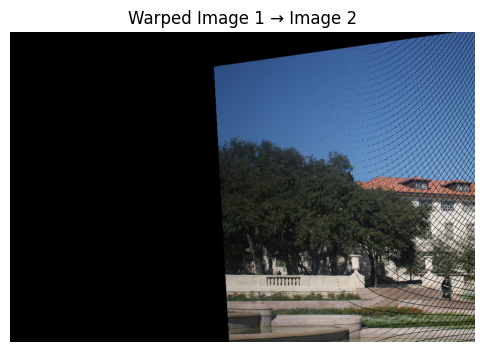

In [188]:
# Warp image 1 into image 2 perspective
h2, w2 = img_2.shape[:2] # type: ignore
warped = forward_warp(img_1, H, (h2, w2))

plt.figure(figsize=(6,6))
plt.imshow(warped)
plt.axis('off')
plt.title("Warped Image 1 → Image 2")
plt.show()

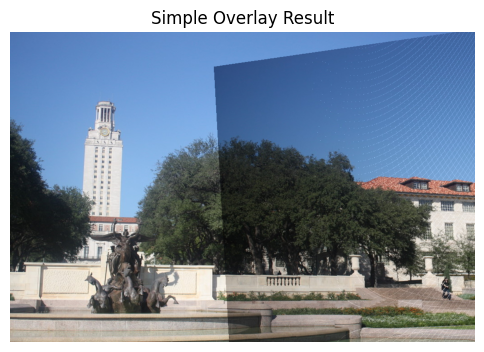

In [189]:

overlay = Overlay(img_2, warped)
plt.figure(figsize=(6,6))
plt.imshow(overlay)
plt.axis('off')
plt.title("Simple Overlay Result")
plt.show()

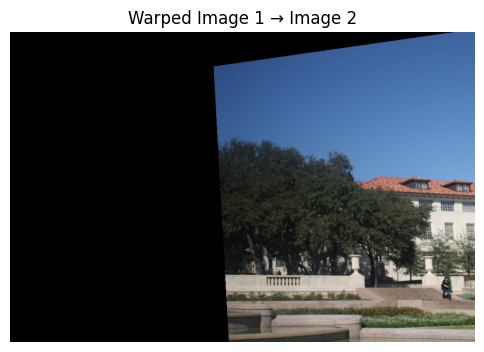

In [ ]:
def forward_warp_Split(img, H, output_shape):
    h_out, w_out = output_shape
    h, w = img.shape[:2]

    warped = np.zeros((h_out, w_out, img.shape[2]), dtype=np.float64)
    weights = np.zeros((h_out, w_out), dtype=np.float64)

    for y in range(h):
        for x in range(w):
            p = np.array([x, y, 1])
            p_prime = H @ p

            if abs(p_prime[2]) < 1e-8:
                continue

            p_prime /= p_prime[2]
            x_new, y_new = p_prime[0], p_prime[1]

            x0 = int(np.floor(x_new))
            y0 = int(np.floor(y_new))

            dx = x_new - x0
            dy = y_new - y0

            # 4 neighbors
            for i, j, wgt in [                   # table of neighbors and their weights 
                (x0,     y0,     (1-dx)*(1-dy)),
                (x0+1,   y0,     dx*(1-dy)),
                (x0,     y0+1,   (1-dx)*dy),
                (x0+1,   y0+1,   dx*dy)]:

                if 0 <= i < w_out and 0 <= j < h_out:
                    warped[j, i] += img[y, x] * wgt
                    weights[j, i] += wgt 

    # normalize (average)
    mask = weights > 0
    warped[mask] /= weights[mask][:, None] # reshape weights to (N,1) so each RGB pixel is divided by its weight

    return warped.astype(img.dtype)

# Warp image 1 into image 2 perspective
h2, w2 = img_2.shape[:2] # type: ignore
warped_split = forward_warp_Split(img_1, H, (h2, w2))

plt.figure(figsize=(6,6))
plt.imshow(warped_split)
plt.axis('off')
plt.title("Warped Image 1 → Image 2")
plt.show()




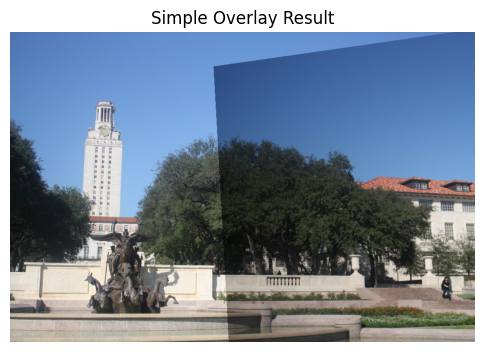

In [187]:

overlay = Overlay(img_2, warped_split)
plt.figure(figsize=(6,6))
plt.imshow(overlay)
plt.axis('off')
plt.title("Simple Overlay Result")
plt.show()

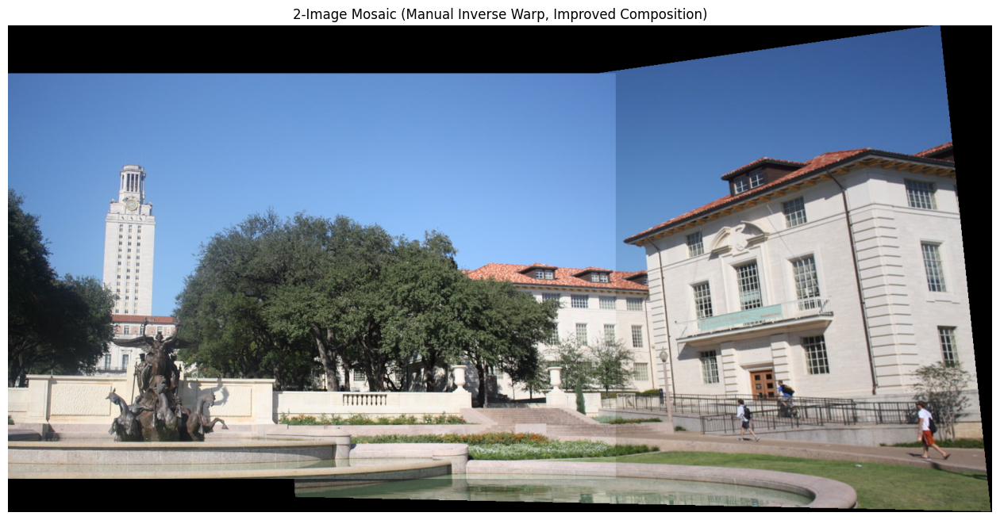

In [ ]:

def to_homogeneous(pts):
    return np.hstack([pts, np.ones((pts.shape[0], 1))]) # convert (N,2) to (N,3) by adding a column of ones for homogeneous coordinates

def project_points(H, pts):
    pts_h = to_homogeneous(pts)
    p = (H @ pts_h.T).T
    return p[:, :2] / (p[:, 2:3] + 1e-12) # convert back from homogeneous coordinates, add small epsilon to avoid division by zero

def bilinear(img, x, y):
    h, w = img.shape[:2]
    x0, y0 = x.astype(int), y.astype(int)
    x1, y1 = x0 + 1, y0 + 1

    valid = (x0 >= 0) & (y0 >= 0) & (x1 < w) & (y1 < h) # valid mask for points that are within image bounds

    out = np.zeros((x.shape[0], 3)) if img.ndim == 3 else np.zeros(x.shape[0]) # initialize output array with correct shape if RGB or grayscale

    if not np.any(valid): 
        return out, valid
    # we only compute bilinear interpolation for valid points to avoid out-of-bounds access , xv and yv are the valid coordinates of the points we want to sample from the image, while x0v, y0v, x1v, y1v are the integer coordinates of the 4 neighbors for each valid point
    xv, yv = x[valid], y[valid]
    x0v, y0v = x0[valid], y0[valid]
    x1v, y1v = x1[valid], y1[valid]

    wa = (x1v - xv) * (y1v - yv)
    wb = (x1v - xv) * (yv - y0v)
    wc = (xv - x0v) * (y1v - yv)
    wd = (xv - x0v) * (yv - y0v)

    Ia = img[y0v, x0v]
    Ib = img[y1v, x0v]
    Ic = img[y0v, x1v]
    Id = img[y1v, x1v]

    if img.ndim == 3:
        out_valid = Ia*wa[:,None] + Ib*wb[:,None] + Ic*wc[:,None] + Id*wd[:,None] # reshape weights to (N,1) so each RGB pixel is multiplied by its weight 
    else:
        out_valid = Ia*wa + Ib*wb + Ic*wc + Id*wd # no reshape needed for grayscale

    out[valid] = out_valid # assign the computed bilinear values to the valid positions in the output array
    return out, valid


def inverse_warp(img, H, out_h, out_w):
    H_inv = np.linalg.inv(H)

    ys, xs = np.indices((out_h, out_w))
    dst = np.stack([xs.ravel(), ys.ravel(), np.ones(xs.size)])

    src = H_inv @ dst
    x = src[0] / (src[2] + 1e-12) # convert back from homogeneous coordinates, add small epsilon to avoid division by zero
    y = src[1] / (src[2] + 1e-12)

    samples, valid = bilinear(img, x, y)

    out = np.zeros((out_h, out_w, 3)) if img.ndim == 3 else np.zeros((out_h, out_w))
    out.reshape(-1, out.shape[-1] if img.ndim == 3 else 1)[:] = samples.reshape(-1, samples.shape[-1] if img.ndim == 3 else 1)

    return out, valid.reshape(out_h, out_w)


def mosaic(img1, img2, H):
    h1, w1 = img1.shape[:2]
    h2, w2 = img2.shape[:2]

    corners1 = np.array([[0,0],[w1,0],[w1,h1],[0,h1]]) # corners of img1 in its own coordinate system
    corners2 = np.array([[0,0],[w2,0],[w2,h2],[0,h2]]) # corners of img2 in its own coordinate system, which will also be the coordinate system of the final mosaic since img2 is the base image we are warping onto

    corners1_warp = project_points(H, corners1)
    all_corners = np.vstack([corners1_warp, corners2])

    min_x, min_y = np.floor(all_corners.min(axis=0)).astype(int)
    max_x, max_y = np.ceil(all_corners.max(axis=0)).astype(int)

    out_w, out_h = max_x - min_x, max_y - min_y

    T = np.array([[1,0,-min_x], # translation matrix to shift the warped image and the second image so that all coordinates are positive and fit within the output canvas
                  [0,1,-min_y],
                  [0,0,1]])

    img1_warp, mask1 = inverse_warp(img1, T @ H, out_h, out_w)

    canvas = np.zeros((out_h, out_w, 3))
    mask2 = np.zeros((out_h, out_w), dtype=bool)

    ox, oy = -min_x, -min_y
    canvas[oy:oy+h2, ox:ox+w2] = img2
    mask2[oy:oy+h2, ox:ox+w2] = True

    # we only copy pixels from img1_warp to canvas where mask1 is True (valid warp) and mask2 is False (no img2 pixel there), so in the overlap region where both masks are True, we keep img2's pixels as they are already in the canvas
    canvas[mask1 & ~mask2] = img1_warp[mask1 & ~mask2] 
    return np.clip(canvas, 0, 255).astype(np.uint8)


H_for_mosaic = H

mosaic_2 = mosaic(img_1, img_2, H_for_mosaic)

plt.figure(figsize=(16, 8))
plt.imshow(mosaic_2)
plt.axis('off')
plt.title('2-Image Mosaic (Manual Inverse Warp, Improved Composition)')
plt.show()

Text(0.5, 1.0, 'Cropped Mosaic')

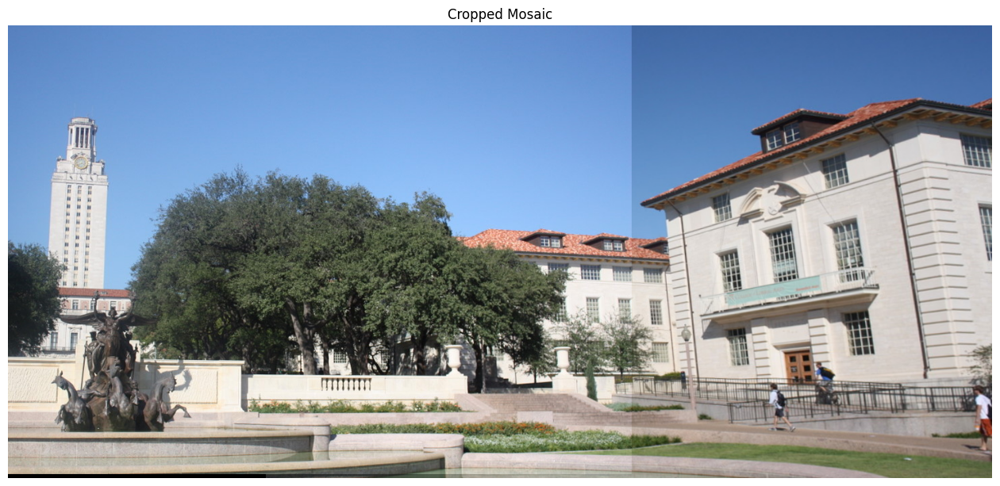

In [214]:
# crop the image to remove black borders
mosaic_cropped = mosaic_2[100:-50, 100:-100]
plt.figure(figsize=(16, 8))
plt.imshow(mosaic_cropped)
plt.axis('off')
plt.title('Cropped Mosaic')

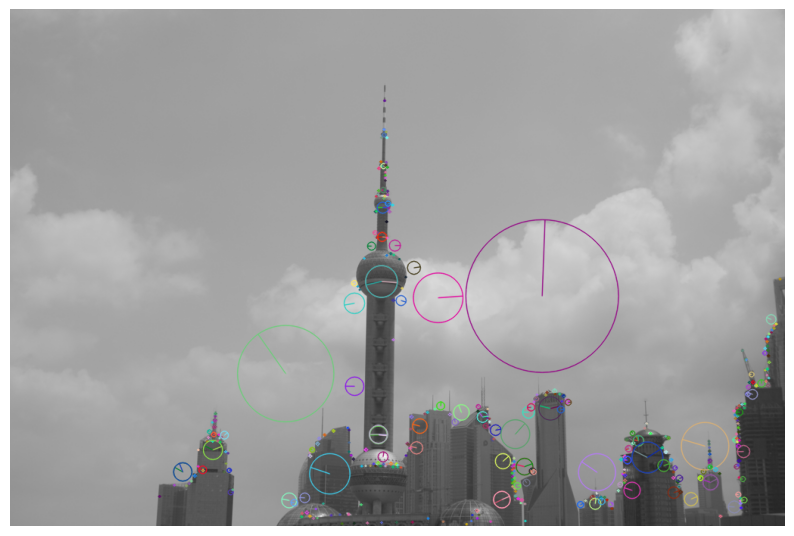

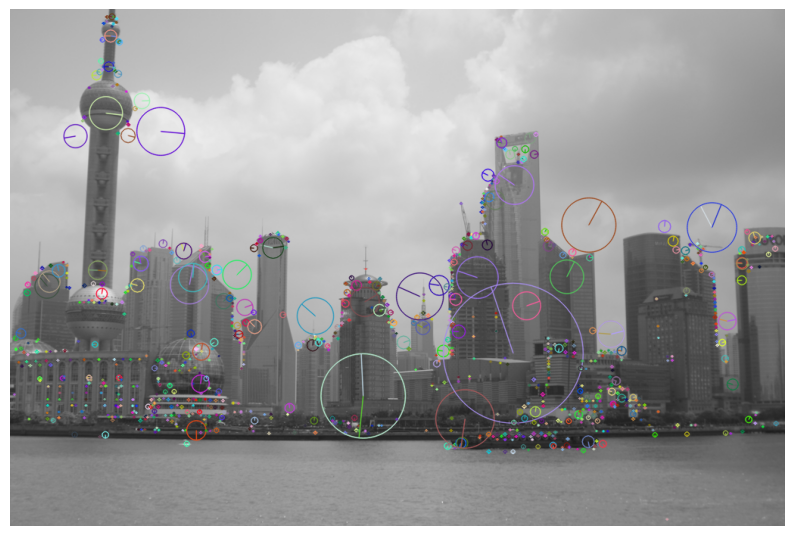

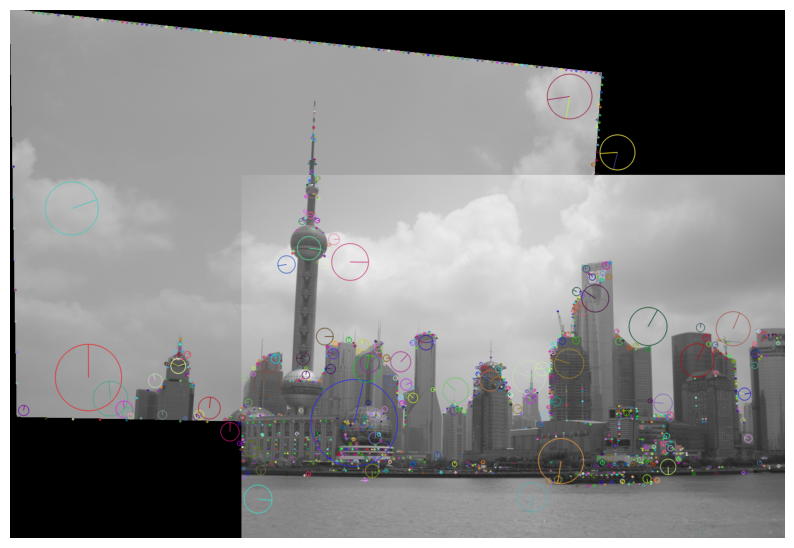

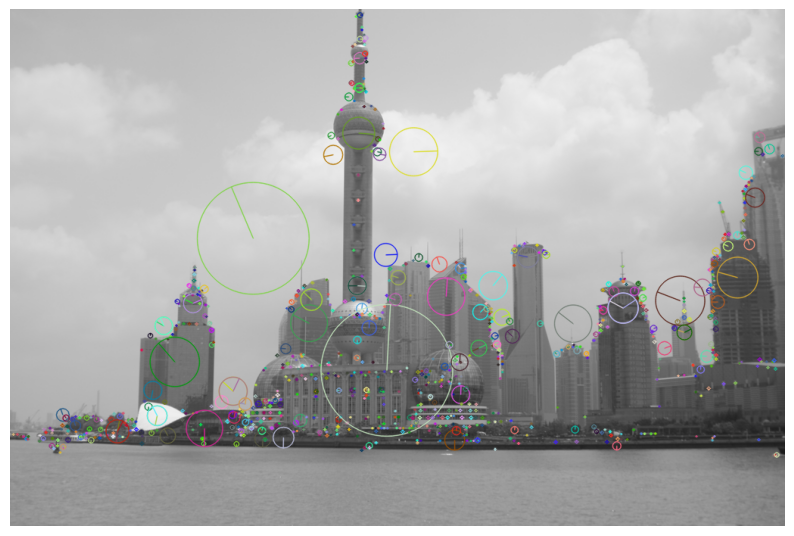

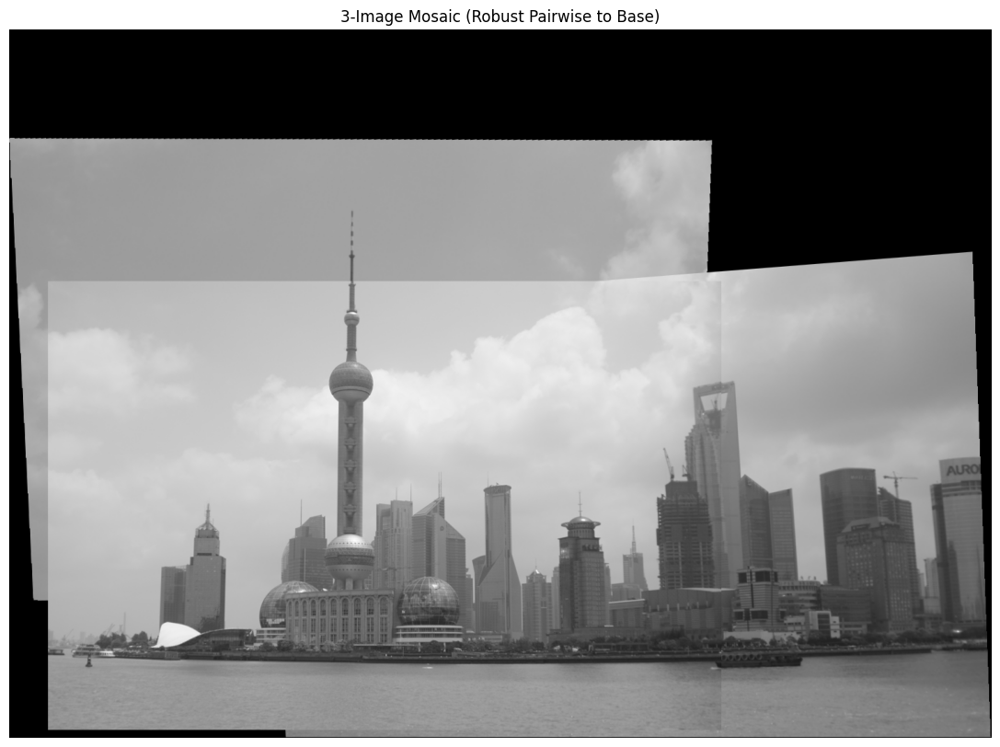

In [235]:


def create_mosaic_three_pairwise_robust(img_1, img_2, img_3):


    # Compute homographies between pairs
    keypoints_2, descriptors_2 = CaptureKeypointsAndDescriptors(cv2.cvtColor(img_2, cv2.COLOR_BGR2GRAY)) # type: ignore
    keypoints_3, descriptors_3 = CaptureKeypointsAndDescriptors(cv2.cvtColor(img_3, cv2.COLOR_BGR2GRAY)) # type: ignore

    matches_23 = brute_force_matching(descriptors_2, descriptors_3)


    H_2_to_3 = ComputeHomography(keypoints_2, keypoints_3, matches_23)

    # Create mosaic of img 2 and img 3 using homography from img 2 to img 3
    mosaic_23 = mosaic(img_2, img_3, H_2_to_3)

    # capture keypoints and descriptors for the mosaic and img 2
    keypoints_mosaic, descriptors_mosaic = CaptureKeypointsAndDescriptors(cv2.cvtColor(mosaic_23, cv2.COLOR_BGR2GRAY)) # type: ignore
    
    keypoints_1, descriptors_1 = CaptureKeypointsAndDescriptors(cv2.cvtColor(img_1, cv2.COLOR_BGR2GRAY)) # type: ignore

    # match mosaic to img 1 to find homography from mosaic to img 1
    matches_mosaic_1 = brute_force_matching(descriptors_mosaic, descriptors_1)
    H_for_mosaic_1_to_1 = ComputeHomography(keypoints_mosaic, keypoints_1, matches_mosaic_1)

    

    # Warp img 3 to mosaic frame using both homographies and blend
    mosaic_final = mosaic(mosaic_23, img_1,H_for_mosaic_1_to_1)


    return mosaic_final
img_21 = cv2.cvtColor(cv2.imread('shanghai-21.png'), cv2.COLOR_BGR2RGB) # type: ignore
img_22 = cv2.cvtColor(cv2.imread('shanghai-22.png'), cv2.COLOR_BGR2RGB) # type: ignore
img_23 = cv2.cvtColor(cv2.imread('shanghai-23.png'), cv2.COLOR_BGR2RGB) # type: ignore

mosaic_231 = create_mosaic_three_pairwise_robust(img_21, img_22, img_23)
plt.figure(figsize=(20, 10))
plt.imshow(mosaic_231)
plt.axis('off')
plt.title('3-Image Mosaic (Robust Pairwise to Base)')
plt.show()

